# Forecasting Net Prophet

You’re a growth analyst at [MercadoLibre](http://investor.mercadolibre.com/investor-relations). With over 200 million users, MercadoLibre is the most popular e-commerce site in Latin America. You've been tasked with analyzing the company's financial and user data in clever ways to make the company grow. So, you want to find out if the ability to predict search traffic can translate into the ability to successfully trade the stock.

In [115]:
# Import the required libraries and dependencies
import pandas as pd
import holoviews as hv
from fbprophet import Prophet
import hvplot.pandas
import datetime as dt
from pathlib import Path
%matplotlib inline

## Step 1: Find Unusual Patterns in Hourly Google Search Traffic

In [116]:
# Loading Google search trends csv and displaying dataframe

df_mercado_trends = pd.read_csv(
    Path('Resources/google_hourly_search_trends.csv'),
    index_col='Date',
    parse_dates=True,
    infer_datetime_format=True
)

df_mercado_trends


,Search Trends
Date,
2016-06-01 00:00:00,97
2016-06-01 01:00:00,92
2016-06-01 02:00:00,76
2016-06-01 03:00:00,60
2016-06-01 04:00:00,38
...,...
2020-09-07 20:00:00,71
2020-09-07 21:00:00,83
2020-09-07 22:00:00,96


In [117]:
# Reviewing data types of dataframe
df_mercado_trends.dtypes


Search Trends    int64
dtype: object

In [118]:
# Slice the DataFrame to just the month of May 2020 and plot
df_may_2020 = df_mercado_trends.loc['05-2020']
df_may_2020.hvplot(title='Mercado Search Trends May 2020')

:Curve   [Date]   (Search Trends)

In [119]:
# Sum of total search traffic for May 2020
traffic_may_2020 = df_may_2020.sum()
traffic_may_2020

Search Trends    38181
dtype: int64

In [120]:
# Calcluate the monthly median search traffic across all months 
median_monthly_traffic = df_mercado_trends[['Search Trends']].groupby(by=[df_mercado_trends.index.year, df_mercado_trends.index.month]).sum().median()
median_monthly_traffic

Search Trends    35172.5
dtype: float64

In [121]:
# Difference betweeen search traffic of May 2020 and the overall monthly median value
traffic_may_2020 - median_monthly_traffic

Search Trends    3008.5
dtype: float64

**Question:** Did the Google search traffic increase during the month that MercadoLibre released its financial results?

**Answer:** The Google search traffic increased during the month that the financial results were released.

## Step 2: Mine the Search Traffic Data for Seasonality

In [122]:
# Group and plot average hourly search data by day of week
df_mercado_trends.groupby(df_mercado_trends.index.dayofweek).mean().hvplot(title='Average Traffic by Day of Week', xlabel='Day of Week')


:Curve   [Date]   (Search Trends)

In [124]:
import numpy as np
# Plot search trend by hour of day and day of week using a heatmap
df_mercado_trends.hvplot.heatmap(x='index.hour',y='index.dayofweek', C='Search Trends', cmap='reds').aggregate(function=np.mean)


:HeatMap   [index.hour,index.dayofweek]   (Search Trends)

**Question:** Does any day-of-week effect that you observe concentrate in just a few hours of that day?

**Answer:** All days of week have the most search volume between 22:00 to 2:00 the next day

In [125]:
# Plot average traffic by week of the year
df_mercado_trends.groupby(df_mercado_trends.index.weekofyear).mean().hvplot(title='Average Traffic by Week of Year', xlabel='Week of Year')

c:\Users\magey\anaconda3\envs\dev\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  


:Curve   [Date]   (Search Trends)

**Question:** Does the search traffic tend to increase during the winter holiday period (weeks 40 through 52)?

**Answer:** Search traffic tends to ramp up at the start of winter holiday period (week 40) but then takes a sudden dip during Christmas starting week 51

## Step 3: Relate the Search Traffic to Stock Price Patterns

In [126]:
# Read mercado stock price data and display dataframe
df_mercado_stock = pd.read_csv(
    Path('Resources/mercado_stock_price.csv'),
    index_col='date',
    parse_dates=True,
    infer_datetime_format=True
)

df_mercado_stock

,close
date,
2015-01-02 09:00:00,127.670
2015-01-02 10:00:00,125.440
2015-01-02 11:00:00,125.570
2015-01-02 12:00:00,125.400
2015-01-02 13:00:00,125.170
...,...
2020-07-31 11:00:00,1105.780
2020-07-31 12:00:00,1087.925
2020-07-31 13:00:00,1095.800


In [127]:
# Visualize closing stock price
df_mercado_stock.hvplot(title='Closing Price')


:Curve   [date]   (close)

In [128]:
# Concatenate stock price and google search trends
mercado_stock_trends_df = pd.concat([df_mercado_stock, df_mercado_trends], axis=1).dropna()

mercado_stock_trends_df


,close,Search Trends
2016-06-01 09:00:00,135.160,6.0
2016-06-01 10:00:00,136.630,12.0
2016-06-01 11:00:00,136.560,22.0
2016-06-01 12:00:00,136.420,33.0
2016-06-01 13:00:00,136.100,40.0
...,...,...
2020-07-31 11:00:00,1105.780,20.0
2020-07-31 12:00:00,1087.925,32.0
2020-07-31 13:00:00,1095.800,41.0
2020-07-31 14:00:00,1110.650,47.0


In [129]:
# Slice first half of 2020 in to seperate dataframe
first_half_2020 = mercado_stock_trends_df.loc['2020-01':'2020-06']

first_half_2020


,close,Search Trends
2020-01-02 09:00:00,601.085,9.0
2020-01-02 10:00:00,601.290,14.0
2020-01-02 11:00:00,615.410,25.0
2020-01-02 12:00:00,611.400,37.0
2020-01-02 13:00:00,611.830,50.0
...,...,...
2020-06-30 11:00:00,976.170,17.0
2020-06-30 12:00:00,977.500,27.0
2020-06-30 13:00:00,973.230,37.0
2020-06-30 14:00:00,976.500,45.0


In [130]:
# Plot close price and search trends on seperate axes
first_half_2020.hvplot(shared_axes=False, subplots=True).cols(1)


:NdLayout   [Variable]
   :Curve   [index]   (value)

**Question:** Do both time series indicate a common trend that’s consistent with this narrative?

**Answer:** Both time series do not indicate strong common trend but the 2020-05-05 spike in search trends is inline with the same jump in closing price

In [131]:
# Creating new column by shifting Search Trends by 1 periods 
mercado_stock_trends_df['Lagged Search Trends'] = mercado_stock_trends_df['Search Trends'].shift(1)


In [132]:
# Creating a new stock volatility with a rolling window of 4 periods
mercado_stock_trends_df['Stock Volatility'] = mercado_stock_trends_df['close'].pct_change().rolling(window=4).std()


In [133]:
# Plot stock volatility
mercado_stock_trends_df.hvplot(title='Stock Volatility', y='Stock Volatility')


:Curve   [index]   (Stock Volatility)

**Solution Note:** Note how volatility spiked, and tended to stay high, during the first half of 2020. This is a common characteristic of volatility in stock returns worldwide: high volatility days tend to be followed by yet more high volatility days. When it rains, it pours.

In [134]:
# Creating a new column with hourly stock returns
mercado_stock_trends_df['Hourly Stock Return'] = mercado_stock_trends_df['close'].pct_change()


In [135]:
# Display dataframe
mercado_stock_trends_df


,close,Search Trends,Lagged Search Trends,Stock Volatility,Hourly Stock Return
2016-06-01 09:00:00,135.160,6.0,NaN,NaN,NaN
2016-06-01 10:00:00,136.630,12.0,6.0,NaN,0.010876
2016-06-01 11:00:00,136.560,22.0,12.0,NaN,-0.000512
2016-06-01 12:00:00,136.420,33.0,22.0,NaN,-0.001025
2016-06-01 13:00:00,136.100,40.0,33.0,0.006134,-0.002346
...,...,...,...,...,...
2020-07-31 11:00:00,1105.780,20.0,11.0,0.012837,0.006380
2020-07-31 12:00:00,1087.925,32.0,20.0,0.013549,-0.016147
2020-07-31 13:00:00,1095.800,41.0,32.0,0.013295,0.007239
2020-07-31 14:00:00,1110.650,47.0,41.0,0.013001,0.013552


In [136]:
# Construct correlation table of Stock Volatility, Lagged Search Trends, and Hourly Stock Return
mercado_stock_trends_df[['Stock Volatility','Lagged Search Trends','Hourly Stock Return']].corr()


,Stock Volatility,Lagged Search Trends,Hourly Stock Return
Stock Volatility,1.000000,-0.148938,0.061424
Lagged Search Trends,-0.148938,1.000000,0.017929
Hourly Stock Return,0.061424,0.017929,1.000000


**Question:** Does a predictable relationship exist between the lagged search traffic and the stock volatility or between the lagged search traffic and the stock price returns?

**Answer:** There is a weak inverse relationship between lagged search traffic and stock volatility and there is a very weak to no relationship between lagged search trends and the hourly stock return

## Step 4: Create a Time Series Model with Prophet

In [137]:
#Set up dataframe for FbProphet forecasting by reseting index, renamiong columns and dropping NaN values
mercado_prophet_df = df_mercado_trends.reset_index()
mercado_prophet_df = mercado_prophet_df.rename(columns={'Date':'ds', 'Search Trends':'y'})
mercado_prophet_df.dropna()
mercado_prophet_df


,ds,y
0,2016-06-01 00:00:00,97
1,2016-06-01 01:00:00,92
2,2016-06-01 02:00:00,76
3,2016-06-01 03:00:00,60
4,2016-06-01 04:00:00,38
...,...,...
37101,2020-09-07 20:00:00,71
37102,2020-09-07 21:00:00,83
37103,2020-09-07 22:00:00,96
37104,2020-09-07 23:00:00,97


In [138]:
# Call the Prophet function and start module
model_mercado_trends = Prophet()


In [139]:
# Fit data to module
model_mercado_trends.fit(mercado_prophet_df)


In [140]:
# Create a future dataframe to hold predictions for 2000 hours
future_mercado_trends = model_mercado_trends.make_future_dataframe(periods=2000, freq='H')
future_mercado_trends.tail()


,ds
39101,2020-11-30 04:00:00
39102,2020-11-30 05:00:00
39103,2020-11-30 06:00:00
39104,2020-11-30 07:00:00
39105,2020-11-30 08:00:00


In [141]:
# Predict trend data for future dataframe and display
forecast_mercado_trends = model_mercado_trends.predict(future_mercado_trends)
forecast_mercado_trends


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-06-01 00:00:00,44.178720,81.200184,97.590423,44.178720,44.178720,45.370479,45.370479,45.370479,41.452658,...,1.860213,1.860213,1.860213,2.057608,2.057608,2.057608,0.0,0.0,0.0,89.549200
1,2016-06-01 01:00:00,44.179783,77.211875,94.307996,44.179783,44.179783,41.816276,41.816276,41.816276,37.943467,...,1.810132,1.810132,1.810132,2.062676,2.062676,2.062676,0.0,0.0,0.0,85.996059
2,2016-06-01 02:00:00,44.180845,67.382865,84.227132,44.180845,44.180845,31.492797,31.492797,31.492797,27.656524,...,1.768560,1.768560,1.768560,2.067713,2.067713,2.067713,0.0,0.0,0.0,75.673642
3,2016-06-01 03:00:00,44.181908,51.722708,67.911214,44.181908,44.181908,16.225604,16.225604,16.225604,12.417296,...,1.735591,1.735591,1.735591,2.072718,2.072718,2.072718,0.0,0.0,0.0,60.407512
4,2016-06-01 04:00:00,44.182970,35.613998,51.440937,44.182970,44.182970,-0.889236,-0.889236,-0.889236,-4.678106,...,1.711179,1.711179,1.711179,2.077691,2.077691,2.077691,0.0,0.0,0.0,43.293734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39101,2020-11-30 04:00:00,44.918019,31.264501,48.074870,43.784428,46.015460,-5.496606,-5.496606,-5.496606,-4.678106,...,-1.746568,-1.746568,-1.746568,0.928068,0.928068,0.928068,0.0,0.0,0.0,39.421412
39102,2020-11-30 05:00:00,44.917243,15.423900,32.366365,43.782872,46.015448,-20.966981,-20.966981,-20.966981,-20.514536,...,-1.384690,-1.384690,-1.384690,0.932245,0.932245,0.932245,0.0,0.0,0.0,23.950262
39103,2020-11-30 06:00:00,44.916467,3.143497,20.263195,43.781315,46.015437,-32.931897,-32.931897,-32.931897,-32.844607,...,-1.023675,-1.023675,-1.023675,0.936386,0.936386,0.936386,0.0,0.0,0.0,11.984571
39104,2020-11-30 07:00:00,44.915692,-4.316855,12.797724,43.779758,46.015426,-40.203305,-40.203305,-40.203305,-40.478011,...,-0.665783,-0.665783,-0.665783,0.940489,0.940489,0.940489,0.0,0.0,0.0,4.712387


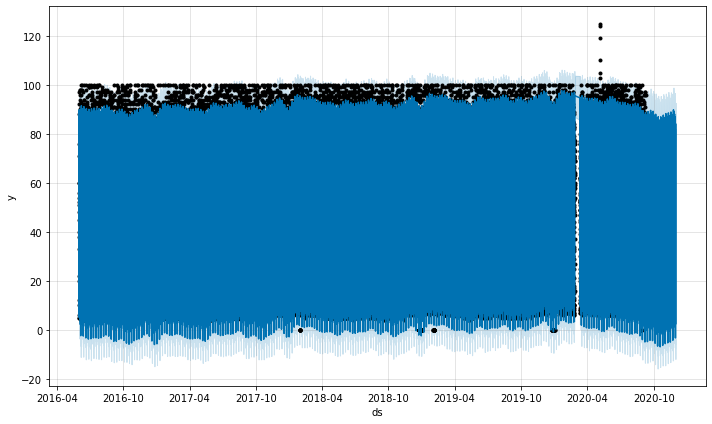

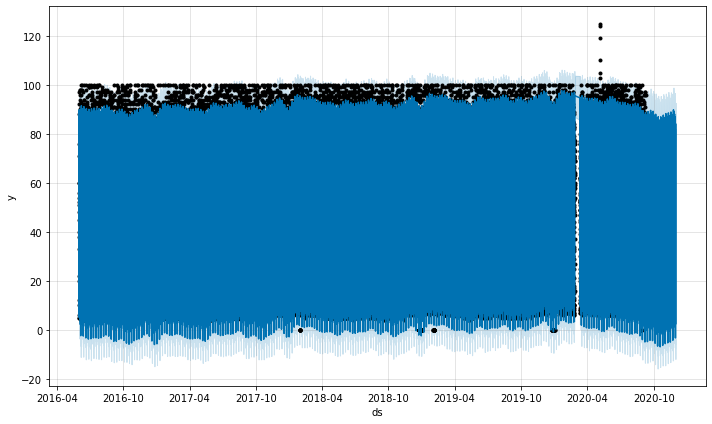

In [142]:
# Plot the Prophet predictions for the Mercado trends data
model_mercado_trends.plot(forecast_mercado_trends)

**Question:**  How's the near-term forecast for the popularity of MercadoLibre?

**Answer:** It seems that there will be a dip in the near-term popularity


In [143]:
# Set the index to the ds datetime column
forecast_mercado_trends = forecast_mercado_trends.set_index('ds')

# View the only the yhat,yhat_lower and yhat_upper columns from the DataFrame
forecast_mercado_trends[['yhat', 'yhat_lower', 'yhat_upper']]


,yhat,yhat_lower,yhat_upper
ds,,,
2016-06-01 00:00:00,89.549200,81.200184,97.590423
2016-06-01 01:00:00,85.996059,77.211875,94.307996
2016-06-01 02:00:00,75.673642,67.382865,84.227132
2016-06-01 03:00:00,60.407512,51.722708,67.911214
2016-06-01 04:00:00,43.293734,35.613998,51.440937
...,...,...,...
2020-11-30 04:00:00,39.421412,31.264501,48.074870
2020-11-30 05:00:00,23.950262,15.423900,32.366365
2020-11-30 06:00:00,11.984571,3.143497,20.263195


Solutions Note: `yhat` represents the most likely (average) forecast, whereas `yhat_lower` and `yhat_upper` represents the worst and best case prediction (based on what are known as 95% confidence intervals).

In [144]:
# PLot yhats From the forecast_mercado_trends DataFrame over the forecasted 2000 hours
forecast_mercado_trends[['yhat', 'yhat_lower', 'yhat_upper']].iloc[-2000:,:].hvplot()


:NdOverlay   [Variable]
   :Curve   [ds]   (value)

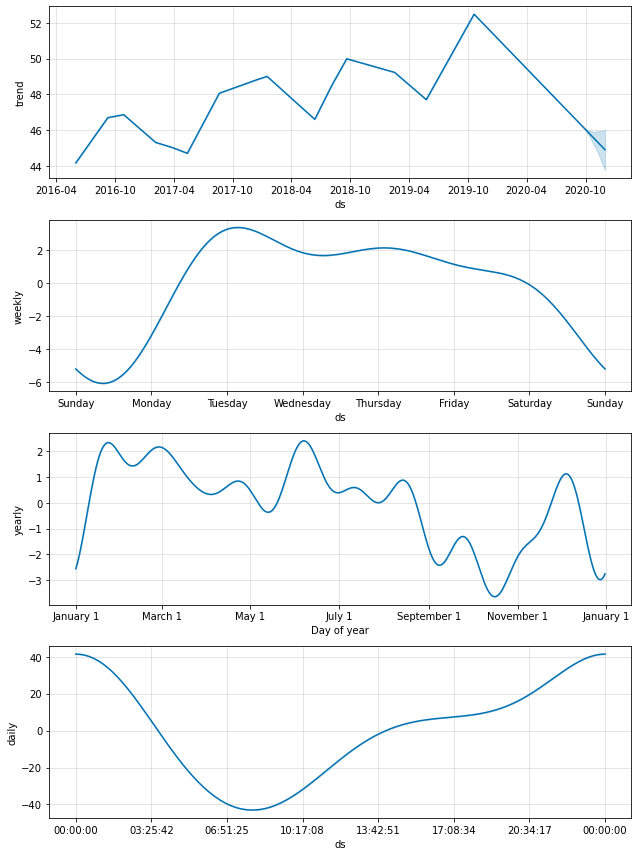

In [145]:
# Reset the index and use the plot_components function to visualize the forecast results
forecast_mercado_trends = forecast_mercado_trends.reset_index()
figures_mercado_trends = model_mercado_trends.plot_components(forecast_mercado_trends)


**Question:** What time of day exhibits the greatest popularity?

**Answer:** Around midnight has the greatest popularity

**Question:** Which day of week gets the most search traffic? 
   
**Answer:** Tuesday has the most search traffic

**Question:** What's the lowest point for search traffic in the calendar year?

**Answer:** The lowest point for search traffic is around mid October

## Step 5 (Optional): Forecast Revenue by Using Time Series Models

In [146]:
# Load csv of mercaod daily revenue
df_mercado_sales = pd.read_csv(
    Path('Resources/mercado_daily_revenue.csv'),
    index_col='date',
    parse_dates=True,
    infer_datetime_format=True
)

df_mercado_sales


,Daily Sales
date,
2019-01-01,0.626452
2019-01-02,1.301069
2019-01-03,1.751689
2019-01-04,3.256294
2019-01-05,3.732920
...,...
2020-05-10,17.467814
2020-05-11,17.537152
2020-05-12,18.031773


In [147]:
# Use hvPlot to visualize the daily sales figures 
df_mercado_sales.hvplot()


:Curve   [date]   (Daily Sales)

In [148]:
# Set up dataframe syntax for Prophet model
mercado_sales_prophet_df = df_mercado_sales.reset_index()
mercado_sales_prophet_df = mercado_sales_prophet_df.rename(columns={'date':'ds','Daily Sales':'y'})
mercado_sales_prophet_df


,ds,y
0,2019-01-01,0.626452
1,2019-01-02,1.301069
2,2019-01-03,1.751689
3,2019-01-04,3.256294
4,2019-01-05,3.732920
...,...,...
495,2020-05-10,17.467814
496,2020-05-11,17.537152
497,2020-05-12,18.031773
498,2020-05-13,19.165315


In [149]:
# Set up model for sales forecasting and train model
mercado_sales_prophet_model = Prophet()
mercado_sales_prophet_model.fit(mercado_sales_prophet_df)


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [150]:
# Create future dataframe for 90 days
mercado_sales_prophet_future = mercado_sales_prophet_model.make_future_dataframe(periods=90, freq='D')
mercado_sales_prophet_future.tail()

,ds
585,2020-08-08
586,2020-08-09
587,2020-08-10
588,2020-08-11
589,2020-08-12


In [151]:
# Make predictions for the sales each day over future dataframe
mercado_sales_prophet_forecast = mercado_sales_prophet_model.predict(mercado_sales_prophet_future)
mercado_sales_prophet_forecast.head()


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-01-01,0.133057,-1.648723,2.132831,0.133057,0.133057,0.063738,0.063738,0.063738,0.063738,0.063738,0.063738,0.0,0.0,0.0,0.196796
1,2019-01-02,0.172238,-1.619489,2.183850,0.172238,0.172238,0.082783,0.082783,0.082783,0.082783,0.082783,0.082783,0.0,0.0,0.0,0.255022
2,2019-01-03,0.211420,-1.648398,2.130582,0.211420,0.211420,0.019584,0.019584,0.019584,0.019584,0.019584,0.019584,0.0,0.0,0.0,0.231003
3,2019-01-04,0.250601,-1.733396,2.055815,0.250601,0.250601,-0.058005,-0.058005,-0.058005,-0.058005,-0.058005,-0.058005,0.0,0.0,0.0,0.192596
4,2019-01-05,0.289782,-1.776007,2.056307,0.289782,0.289782,-0.123987,-0.123987,-0.123987,-0.123987,-0.123987,-0.123987,0.0,0.0,0.0,0.165795


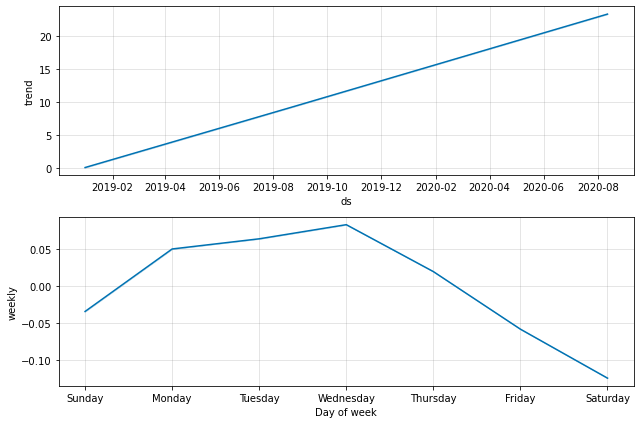

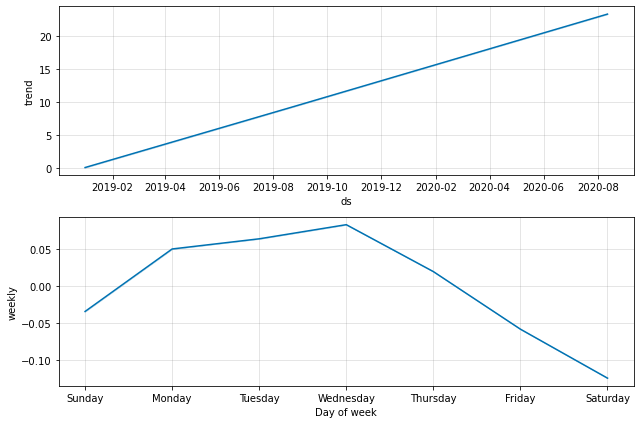

In [152]:
# Use the plot_components function to analyze seasonal patterns in the company's revenue
mercado_sales_prophet_model.plot_components(mercado_sales_prophet_forecast)


**Question:** For example, what are the peak revenue days? (Mondays? Fridays? Something else?)

**Answer:** Wednesdays are the peak revenue days

<AxesSubplot:>

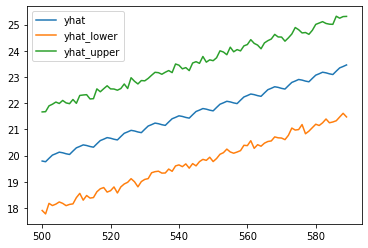

In [153]:
# Plot the predictions for the Mercado sales
mercado_sales_prophet_forecast[['yhat', 'yhat_lower', 'yhat_upper']].iloc[-90:,:].plot()


In [154]:
# Set index back to datetime column
mercado_sales_prophet_forecast = mercado_sales_prophet_forecast.set_index('ds')
mercado_sales_prophet_forecast

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
ds,,,,,,,,,,,,,,,
2019-01-01,0.133057,-1.648723,2.132831,0.133057,0.133057,0.063738,0.063738,0.063738,0.063738,0.063738,0.063738,0.0,0.0,0.0,0.196796
2019-01-02,0.172238,-1.619489,2.183850,0.172238,0.172238,0.082783,0.082783,0.082783,0.082783,0.082783,0.082783,0.0,0.0,0.0,0.255022
2019-01-03,0.211420,-1.648398,2.130582,0.211420,0.211420,0.019584,0.019584,0.019584,0.019584,0.019584,0.019584,0.0,0.0,0.0,0.231003
2019-01-04,0.250601,-1.733396,2.055815,0.250601,0.250601,-0.058005,-0.058005,-0.058005,-0.058005,-0.058005,-0.058005,0.0,0.0,0.0,0.192596
2019-01-05,0.289782,-1.776007,2.056307,0.289782,0.289782,-0.123987,-0.123987,-0.123987,-0.123987,-0.123987,-0.123987,0.0,0.0,0.0,0.165795
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-08,23.219270,21.284811,25.010013,23.216060,23.221896,-0.123987,-0.123987,-0.123987,-0.123987,-0.123987,-0.123987,0.0,0.0,0.0,23.095283
2020-08-09,23.258876,21.331936,25.318616,23.255605,23.261571,-0.034157,-0.034157,-0.034157,-0.034157,-0.034157,-0.034157,0.0,0.0,0.0,23.224719
2020-08-10,23.298483,21.475405,25.244363,23.295159,23.301215,0.050045,0.050045,0.050045,0.050045,0.050045,0.050045,0.0,0.0,0.0,23.348528


In [155]:
# Produce a sales forecast for the finance division
# giving them a number for expected total sales next quarter.
# Provide best case (yhat_upper), worst case (yhat_lower), and most likely (yhat) scenarios.

# Create a forecast_quarter Dataframe for the period 2020-07-01 to 2020-09-30 that includes the columns yhat_upper, yhat_lower, and yhat
mercado_sales_forecast_quarter = mercado_sales_prophet_forecast[['yhat', 'yhat_lower', 'yhat_upper']].loc['2020-07-01':'2020-09-30']

# Update the column names for the forecast_quarter DataFrame to match what the finance division is looking for 
mercado_sales_forecast_quarter = mercado_sales_forecast_quarter.rename(columns={'yhat':'most likely', 'yhat_upper':'best case', 'yhat_lower':'worst case'})

# Review the last five rows of the DataFrame
mercado_sales_forecast_quarter.tail()


,most likely,worst case,best case
ds,,,
2020-08-08,23.095283,21.284811,25.010013
2020-08-09,23.224719,21.331936,25.318616
2020-08-10,23.348528,21.475405,25.244363
2020-08-11,23.401827,21.615663,25.305931
2020-08-12,23.460478,21.477309,25.312677


In [156]:
# Displayed the summed values for all the rows in the forecast_quarter DataFrame
mercado_sales_forecast_quarter.sum()


most likely     969.559258
worst case      888.196272
best case      1051.979671
dtype: float64

### Based on the forecast information generated above, produce a sales forecast for the finance division, giving them a number for expected total sales next quarter. Include best and worst case scenarios, to better help the finance team plan.

**Answer:** For Mercado, it is most likely that they will have 970 sales next quarter which could reach 1052 at best case or in the worst case go as low as 887